In [20]:
from core.constants import SOURCE_DIR, FOURTH_WAVE_FILE, LABEL_COLUMN, FIRST_WAVE_FILE
import os
import pandas as pd


dataset = pd.read_excel(os.path.join(SOURCE_DIR, FOURTH_WAVE_FILE))
dataset.head()
len(dataset)

1251

In [21]:
dataset = dataset.dropna(subset=[LABEL_COLUMN])
len(dataset)

1248

In [22]:
from core.constants import CATEGORICAL_FEATURES

print("Number of categorical features: ", len(CATEGORICAL_FEATURES))

Number of categorical features:  64


In [23]:
# get numeric attributes
NUMERIC_FEATURES = set(dataset.columns) - set(CATEGORICAL_FEATURES)
NUMERIC_FEATURES.remove(LABEL_COLUMN)
NUMERIC_FEATURES = list(NUMERIC_FEATURES)
len(NUMERIC_FEATURES)

188

In [24]:
X = dataset.drop(columns=[LABEL_COLUMN])
y = dataset[LABEL_COLUMN]

In [25]:
# Convert null values to "Unknown" for categorical columns
X[CATEGORICAL_FEATURES] = X[CATEGORICAL_FEATURES].fillna("Unknown")

In [26]:
X.select_dtypes(include=["object"])

,Pohlavie,Typ vakcíny
0,Žena,Unknown
1,Muž,mRNA
2,Muž,Unknown
3,Muž,Unknown
4,Muž,Unknown
...,...,...
1246,Muž,Unknown
1247,Žena,Unknown
1248,Žena,Unknown
1249,Žena,Unknown


In [27]:
X["Pohlavie"] = X["Pohlavie"].astype("category")
X["Typ vakcíny"] = X["Typ vakcíny"].astype("category")

In [28]:
y = y.astype(str)

# CatBoost

In [10]:
for col in CATEGORICAL_FEATURES:
    X[col] = X[col].astype("category")

In [19]:
from catboost import CatBoostClassifier
from sklearn.model_selection import train_test_split


X_train, X_test, y_train, y_test = train_test_split(
    X, y, test_size=0.2, random_state=42, stratify=y
)
# Initialize CatBoostClassifier
model = CatBoostClassifier(
    iterations=500,  # Number of boosting iterations
    learning_rate=0.2,  # Learning rate
    depth=6,  # Depth of the trees
    loss_function="MultiClass",  # Multi-class classification loss function
    verbose=100,  # Display progress every 100 iterations
    random_seed=42,  # Seed for reproducibility
)
model.fit(
    X_train, y_train, cat_features=CATEGORICAL_FEATURES
)  # Specify categorical indices
y_pred = model.predict(X_test)
y_pred_proba = model.predict_proba(X_test)

0:	learn: 0.9513324	total: 2.08s	remaining: 17m 15s
100:	learn: 0.1260430	total: 27.4s	remaining: 1m 48s
200:	learn: 0.0516006	total: 41.3s	remaining: 1m 1s
300:	learn: 0.0277312	total: 52.9s	remaining: 35s
400:	learn: 0.0177936	total: 1m 3s	remaining: 15.6s
499:	learn: 0.0128472	total: 1m 12s	remaining: 0us


In [20]:
from data_preparation.utils import show_metrics


show_metrics(y_test, y_pred, y_pred_proba)

Výsledky modelu:
Accuracy: 0.8267
Precision: 0.8220
Recall: 0.8267
F1-score: 0.8192
AUC-ROC: 0.9157

Klasifikačná správa:
              precision    recall  f1-score   support

           1       0.87      0.94      0.90       142
           2       0.76      0.55      0.64        56
           3       0.71      0.81      0.76        27

    accuracy                           0.83       225
   macro avg       0.78      0.77      0.77       225
weighted avg       0.82      0.83      0.82       225



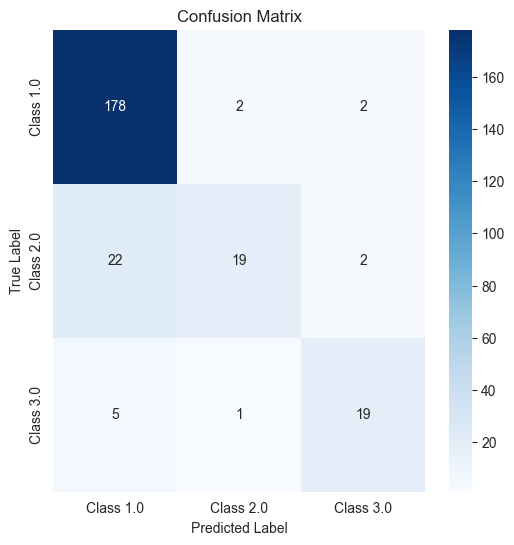

In [19]:
from data_preparation.utils import show_confusion_matrix

show_confusion_matrix(y_test, y_pred)

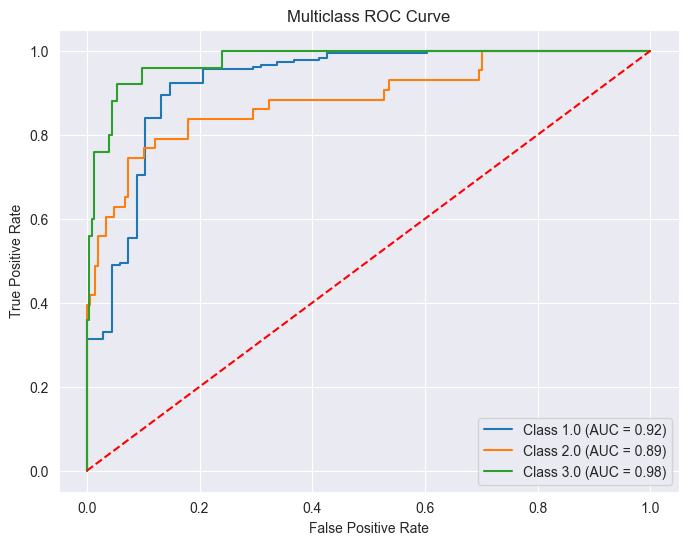

In [20]:
from data_preparation.utils import show_roc

show_roc(y_test, y_pred_proba)

In [23]:
import joblib

joblib.dump(model, r"./model_dump/covid_severity_catboost.joblib")

['./model_dump/covid_severity_catboost.joblib']

In [32]:
list(X.columns)

['Pohlavie',
 'Vek',
 'A04.7',
 'Fajčenie',
 'Alkohol',
 'S-Bil-T first',
 'S-Bil-T last',
 'S-Bil-T min',
 'S-Bil-T max',
 'S-AST first',
 'S-AST last',
 'S-AST min',
 'S-AST max',
 'S-ALT first',
 'S-ALT last',
 'S-ALT min',
 'S-ALT max',
 'S-GMT first',
 'S-GMT last',
 'S-GMT min',
 'S-GMT max',
 'S-ALP first',
 'S-ALP last',
 'S-ALP min',
 'S-ALP max',
 'S-Chol first',
 'S-Chol last',
 'S-Chol min',
 'S-Chol max',
 'S-CB first',
 'S-CB last',
 'S-CB min',
 'S-CB max',
 'S-Na first',
 'S-Na last',
 'S-Na min',
 'S-Na max',
 'S-K first',
 'S-K last',
 'S-K min',
 'S-K max',
 'S-CL first',
 'S-CL last',
 'S-CL min',
 'S-CL max',
 'S-IgG first',
 'S-IgG last',
 'S-IgG min',
 'S-IgG max',
 'S-IgA first',
 'S-IgA last',
 'S-IgA min',
 'S-IgA max',
 'S-Ig M first',
 'S-Ig M last',
 'S-Ig M min',
 'S-Ig M max',
 'S-CRP first',
 'S-CRP last',
 'S-CRP min',
 'S-CRP max',
 'S-Alb first',
 'S-Alb last',
 'S-Alb min',
 'S-Alb max',
 'S-Gluk first',
 'S-Gluk last',
 'S-Gluk min',
 'S-Gluk max',


## Celková výkonnosť modelu:

- Accuracy: 0.8267 (82.67%)

Model správne klasifikoval približne 83 % prípadov na testovacích dátach.
Pri multiclass probléme je táto hodnota veľmi slušná, ale neodráža rovnováhu medzi triedami.
 - Precision (Weighted Average): 0.8220

Priemerná presnosť modelu naznačuje, že model generuje relatívne málo false positives (nesprávne predikcie ako pozitívne triedy).
- Recall (Weighted Average): 0.8267

Model zachytil približne 83 % všetkých skutočných pozitívnych prípadov (závisí od triedy).
- F1-score (Weighted Average): 0.8192

Kombinuje presnosť a recall. Hodnota okolo 0.82 naznačuje, že model je celkovo vyvážený.
- AUC-ROC: 0.9157

Hodnota AUC je vysoká, čo znamená, že model dokáže dobre odlíšiť triedy. Toto naznačuje robustnú diskriminačnú schopnosť modelu.

## Výkon na jednotlivých triedach:
### Trieda 1:
- Precision: 0.87
- Recall: 0.94
- F1-score: 0.90

Model exceluje pri predikcii triedy 1. Má vysokú presnosť aj recall, čo znamená, že správne identifikuje väčšinu prípadov tejto triedy s minimom chybných predikcií.

### Trieda 2:
- Precision: 0.76
- Recall: 0.55
- F1-score: 0.64

Trieda 2 má nižší výkon, hlavne pre nízky recall. Model nezachytáva všetky prípady triedy 2. Toto môže byť spôsobené:
Nerovnováhou v dátach (iba 56 prípadov).
Potenciálne vyššou zložitosťou charakteristík tejto triedy.

### Trieda 3:
- Precision: 0.71
- Recall: 0.81
- F1-score: 0.76

Trieda 3 má lepší recall než precision, čo znamená, že model zachytáva väčšinu skutočných prípadov, no generuje o niečo viac false positives.

In [127]:
feature_importances = model.get_feature_importance(prettified=True)

In [128]:
feature_importances

,Feature Id,Importances
0,S-IL6 last,7.009627
1,S-Na max,3.056818
2,S-Na last,2.314848
3,SatO2 %,2.225618
4,Vek,2.197603
...,...,...
247,62916 SMECTA,0.000000
248,24859 PENTOXYPHILLINUM,0.000000
249,ASPIRIN,0.000000
250,Prekonal COVID-19,0.000000


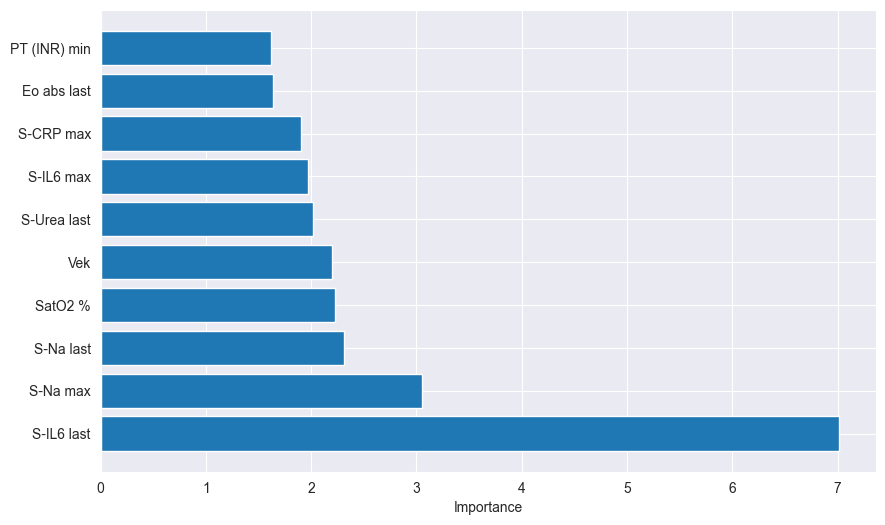

In [129]:
import matplotlib.pyplot as plt


plt.figure(figsize=(10, 6))
plt.barh(
    feature_importances["Feature Id"][:10], feature_importances["Importances"][:10]
)
plt.xlabel("Importance")
plt.show()

## Potenciálne vylepšenia:
- Vyváženie tried:

Triedy sú nerovnomerne zastúpené (1: 142, 2: 56, 3: 27), čo môže spôsobovať horší výkon na menších triedach.
Riešenia:
Použiť vážené loss funkcie v modeli (CatBoost má parameter class_weights).
Použiť oversampling alebo undersampling metódy na vyváženie tried.

- Zlepšenie výkonu na triede 2:

Analyzovať atribúty, ktoré model používa na predikciu triedy 2. Možno niektoré atribúty nemajú dostatočnú diskriminačnú schopnosť.
Pridať viac relevantných dát pre túto triedu.

- Hyperparameter Tuning:

Vyskúšať ladenie hyperparametrov (napr. learning_rate, depth, iterations) pre lepší výkon.

- Feature Engineering:

Skontrolovať, či je možné vytvoriť nové črty, ktoré môžu lepšie diskriminovať triedy, najmä tie menšie.

# CatBoost Váženie tried

In [130]:
from collections import Counter
from catboost import CatBoostClassifier
from sklearn.model_selection import train_test_split
from sklearn.impute import KNNImputer


X_train, X_test, y_train, y_test = train_test_split(
    X, y, test_size=0.2, random_state=42, stratify=y
)

# ✅ 2️⃣ One-hot encoding pre kategorizované atribúty
X_train = pd.get_dummies(X_train)
X_test = pd.get_dummies(X_test)

# ✅ 3️⃣ Zabezpečenie rovnakých stĺpcov v tréningovej aj testovacej sade
X_test = X_test.reindex(columns=X_train.columns, fill_value=0)

# ✅ 4️⃣ Detekcia boolean-like stĺpcov (0/1)
BOOLEAN_FEATURES = [
    col for col in X_train.columns if set(X_train[col].unique()) == {0, 1}
]

# ✅ 5️⃣ Konverzia boolean-like stĺpcov na `int`
X_train[BOOLEAN_FEATURES] = X_train[BOOLEAN_FEATURES].astype(int)
X_test[BOOLEAN_FEATURES] = X_test[BOOLEAN_FEATURES].astype(int)

# ✅ 6️⃣ Inicializácia KNN imputera a imputácia chýbajúcich hodnôt
imputer = KNNImputer(n_neighbors=5)
X_train = pd.DataFrame(
    imputer.fit_transform(X_train), columns=X_train.columns, index=X_train.index
)
X_test = pd.DataFrame(
    imputer.transform(X_test), columns=X_test.columns, index=X_test.index
)

# Počet vzoriek pre každú triedu
class_counts = Counter(y_train)
total_samples = len(y_train)

# Výpočet váh
class_weights = {cls: total_samples / count for cls, count in class_counts.items()}
print(f"Class Weights: {class_weights}")

# Tréning modelu s class_weights
model = CatBoostClassifier(
    class_weights=class_weights,  # Vyváženie tried
    iterations=500,
    learning_rate=0.2,
    depth=6,
    loss_function="MultiClass",
    verbose=100,
    random_seed=42,
)

model.fit(X_train, y_train)

y_pred = model.predict(X_test)
y_pred_proba = model.predict_proba(X_test)

Class Weights: {'1.0': 1.376551724137931, '2.0': 5.870588235294117, '3.0': 9.689320388349515}
0:	learn: 1.0218909	total: 75.9ms	remaining: 37.9s
100:	learn: 0.1089742	total: 8.68s	remaining: 34.3s
200:	learn: 0.0482118	total: 16.6s	remaining: 24.6s
300:	learn: 0.0297322	total: 24.3s	remaining: 16s
400:	learn: 0.0192047	total: 32s	remaining: 7.9s
499:	learn: 0.0136424	total: 40.2s	remaining: 0us


In [131]:
from data_preparation.utils import show_metrics


show_metrics(y_test, y_pred, y_pred_proba)

Výsledky modelu:
Accuracy: 0.8280
Precision: 0.8193
Recall: 0.8280
F1-score: 0.8211
AUC-ROC: 0.9226

Klasifikačná správa:
              precision    recall  f1-score   support

         1.0       0.89      0.93      0.91       182
         2.0       0.62      0.47      0.53        43
         3.0       0.64      0.72      0.68        25

    accuracy                           0.83       250
   macro avg       0.72      0.70      0.71       250
weighted avg       0.82      0.83      0.82       250



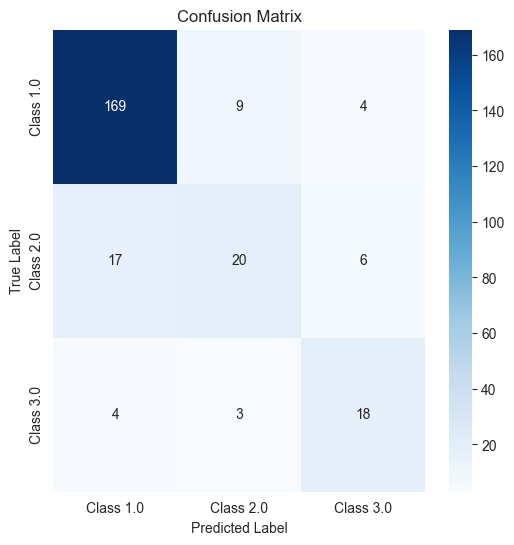

In [132]:
from data_preparation.utils import show_confusion_matrix

show_confusion_matrix(y_test, y_pred)

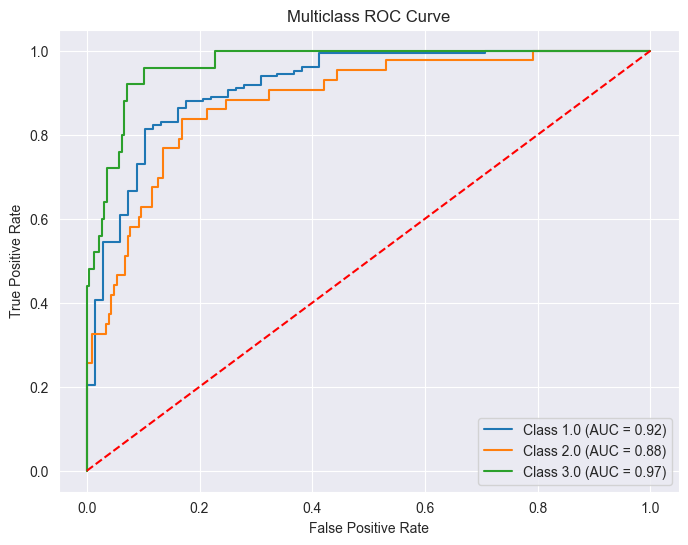

In [133]:
from data_preparation.utils import show_roc


show_roc(y_test, y_pred_proba)

# CatBoost (SMOTE)

Čo je to SMOTE?
SMOTE (Synthetic Minority Over-sampling Technique) je technika používaná na riešenie problémov s nevyváženými dátovými súbormi v klasifikácii. Keď máme dátový súbor, kde je jedna trieda výrazne menej zastúpená ako iné, môže to viesť k zlému výkonu klasifikátora na tejto menšinovej triede. SMOTE rieši tento problém tým, že synteticky vytvára nové príklady pre menšinovú triedu.

SMOTE funguje tak, že pre každý príklad v menšinovej triede nájde jeho najbližších susedov a vytvorí nové syntetické príklady interpoláciou medzi týmito príkladmi a ich susedmi2. Týmto spôsobom sa zvyšuje počet príkladov v menšinovej triede a zlepšuje sa výkon klasifikátora na tejto triede.

In [134]:
from sklearn.model_selection import train_test_split
from imblearn.over_sampling import SMOTE
from catboost import CatBoostClassifier
from sklearn.impute import KNNImputer


# Rozdelenie dát na trénovaciu a testovaciu množinu
X_train, X_test, y_train, y_test = train_test_split(
    X, y, test_size=0.2, random_state=42, stratify=y
)

# ✅ 2️⃣ One-hot encoding pre kategorizované atribúty
X_train = pd.get_dummies(X_train)
X_test = pd.get_dummies(X_test)

# ✅ 3️⃣ Zabezpečenie rovnakých stĺpcov v tréningovej aj testovacej sade
X_test = X_test.reindex(columns=X_train.columns, fill_value=0)

# ✅ 4️⃣ Detekcia boolean-like stĺpcov (0/1)
BOOLEAN_FEATURES = [
    col for col in X_train.columns if set(X_train[col].unique()) == {0, 1}
]

# ✅ 5️⃣ Konverzia boolean-like stĺpcov na `int`
X_train[BOOLEAN_FEATURES] = X_train[BOOLEAN_FEATURES].astype(int)
X_test[BOOLEAN_FEATURES] = X_test[BOOLEAN_FEATURES].astype(int)

# ✅ 6️⃣ Inicializácia KNN imputera a imputácia chýbajúcich hodnôt
imputer = KNNImputer(n_neighbors=5)
X_train = pd.DataFrame(
    imputer.fit_transform(X_train), columns=X_train.columns, index=X_train.index
)
X_test = pd.DataFrame(
    imputer.transform(X_test), columns=X_test.columns, index=X_test.index
)

# ✅ 8️⃣ Použitie SMOTE na vyváženie datasetu (iba na tréningové dáta!)
smote = SMOTE(random_state=42)
X_train_resampled, y_train_resampled = smote.fit_resample(X_train, y_train)

# Tréning modelu
model = CatBoostClassifier(
    iterations=500,
    depth=6,
    learning_rate=0.2,
    verbose=100,
)
model.fit(X_train_resampled, y_train_resampled)

# Predikcie
y_pred = model.predict(X_test)
y_pred_proba = model.predict_proba(X_test)

0:	learn: 0.9732032	total: 70.7ms	remaining: 35.3s
100:	learn: 0.0910440	total: 8.83s	remaining: 34.9s
200:	learn: 0.0402368	total: 17.7s	remaining: 26.3s
300:	learn: 0.0227907	total: 26.4s	remaining: 17.4s
400:	learn: 0.0149412	total: 35.2s	remaining: 8.7s
499:	learn: 0.0106386	total: 44.1s	remaining: 0us


In [135]:
from data_preparation.utils import show_metrics


show_metrics(y_test, y_pred, y_pred_proba)

Výsledky modelu:
Accuracy: 0.8560
Precision: 0.8470
Recall: 0.8560
F1-score: 0.8491
AUC-ROC: 0.9386

Klasifikačná správa:
              precision    recall  f1-score   support

         1.0       0.90      0.96      0.93       182
         2.0       0.70      0.53      0.61        43
         3.0       0.71      0.68      0.69        25

    accuracy                           0.86       250
   macro avg       0.77      0.72      0.74       250
weighted avg       0.85      0.86      0.85       250



## Fine-Tuning CatBoost Hyperparameters

## Ktorú metódu odporúčam?

- **Malý dataset?** → `GridSearchCV` alebo `RandomizedSearchCV`
- **Veľký dataset?** → `Bayesian Optimization (Optuna)`
- **Dlhý tréning modelov?** → `Hyperband` alebo `Early Stopping`
- **Mnoho hyperparametrov?** → `Genetické algoritmy (TPOT/DEAP)`


In [136]:
# from catboost import CatBoostClassifier
# from sklearn.model_selection import GridSearchCV, train_test_split
# import time
#
# # Assuming X and y are defined
# X_train, X_test, y_train, y_test = train_test_split(
#     X, y, test_size=0.2, random_state=42, stratify=y
# )
#
# # Initialize CatBoost model
# model = CatBoostClassifier(
#     loss_function="MultiClass",
#     cat_features=CATEGORICAL_FEATURES,
#     verbose=0,
#     random_seed=42,
# )
#
# # Define the parameter grid
# param_grid = {
#     "iterations": [250, 450, 750],
#     "learning_rate": [0.05, 0.1, 0.2],
#     "depth": [4, 6, 8],
#     "l2_leaf_reg": [
#         3,
#         5,
#         7,
#     ],  # Regularization parameter, higher values prevent overfitting
#     "bagging_temperature": [0, 0.5, 1],
# }
#
# # Perform GridSearchCV with verbose output
# grid_search = GridSearchCV(
#     estimator=model, param_grid=param_grid, scoring="f1_weighted", cv=3, verbose=2
# )
#
# start_time = time.time()
# grid_search.fit(X_train, y_train)
# end_time = time.time()
#
# # Best parameters and score
# print("Best Parameters:", grid_search.best_params_)
# print("Best Score:", grid_search.best_score_)
# print(f"Total time taken: {end_time - start_time:.2f} seconds")

Best Parameters: {'bagging_temperature': 0, 'depth': 6, 'iterations': 750, 'l2_leaf_reg': 7, 'learning_rate': 0.2}
Best Score: 0.8105686536069147
Total time taken: 9027.06 seconds

In [137]:
# # Unused for now, we might use this when optimizing on a larger scale
# from sklearn.model_selection import RandomizedSearchCV
# from scipy.stats import uniform
#
# # Define the parameter distributions
# param_dist = {
#     "iterations": [500, 1000, 1500],
#     "learning_rate": uniform(0.01, 0.1),
#     "depth": [4, 6, 8, 10],
#     "l2_leaf_reg": uniform(1, 10),
#     "bagging_temperature": uniform(0, 1),
# }
# model = CatBoostClassifier(
#     loss_function="MultiClass", cat_features=CATEGORICAL_FEATURES, verbose=0
# )
# # Perform RandomizedSearchCV
# random_search = RandomizedSearchCV(
#     estimator=model,
#     param_distributions=param_dist,
#     n_iter=50,
#     scoring="f1_weighted",
#     cv=3,
#     random_state=42,
# )
# random_search.fit(X_train, y_train)
#
# # Best parameters and score
# print("Best Parameters:", random_search.best_params_)
# print("Best Score:", random_search.best_score_)

In [138]:
# # Bayesian Optimization, maybe after merging 4 datasets
# import optuna
# from catboost import CatBoostClassifier
# from sklearn.metrics import f1_score
#
#
# def objective(trial):
#     # Suggest hyperparameters
#     iterations = trial.suggest_int("iterations", 500, 1500)
#     learning_rate = trial.suggest_float("learning_rate", 0.01, 0.1)
#     depth = trial.suggest_int("depth", 4, 10)
#     l2_leaf_reg = trial.suggest_float("l2_leaf_reg", 1, 10)
#     bagging_temperature = trial.suggest_float("bagging_temperature", 0, 1)
#
#     # Train model
#     model = CatBoostClassifier(
#         iterations=iterations,
#         learning_rate=learning_rate,
#         depth=depth,
#         l2_leaf_reg=l2_leaf_reg,
#         bagging_temperature=bagging_temperature,
#         loss_function="MultiClass",
#         cat_features=CATEGORICAL_FEATURES,
#         verbose=0,
#     )
#     model.fit(X_train, y_train, eval_set=(X_test, y_test), early_stopping_rounds=50)
#
#     # Evaluate performance
#     preds = model.predict(X_test)
#     f1 = f1_score(y_test, preds, average="weighted")
#     return f1
#
#
# # Run Optuna
# study = optuna.create_study(direction="maximize")
# study.optimize(objective, n_trials=50)
#
# # Best hyperparameters
# print("Best Hyperparameters:", study.best_params)

## HistGradientBoostingClassifier

In [18]:
from sklearn.ensemble import HistGradientBoostingClassifier
from sklearn.model_selection import train_test_split

# Train-test split
X_train, X_test, y_train, y_test = train_test_split(
    X, y, test_size=0.2, random_state=42
)
X_train["Pohlavie"] = X_train["Pohlavie"].map({"Žena": 0, "Muž": 1})
X_train["Typ vakcíny"] = X_train["Typ vakcíny"].map({"mRNA": 0, "vector": 1})
X_test["Pohlavie"] = X_test["Pohlavie"].map({"Žena": 0, "Muž": 1})
X_test["Typ vakcíny"] = X_test["Typ vakcíny"].map({"mRNA": 0, "vector": 1})
# Initialize the model
model = HistGradientBoostingClassifier(
    categorical_features=CATEGORICAL_FEATURES,
    random_state=42,
    verbose=100,
    learning_rate=0.2,
    max_iter=500,
    max_depth=6,
)
# Train the model
model.fit(X_train, y_train)

# Predictions
y_pred = model.predict(X_test)
y_pred_proba = model.predict_proba(X_test)

Binning 0.002 GB of training data: 7.207 s
Fitting gradient boosted rounds:
[1/500] 3 trees, 45 leaves (15 on avg), max depth = 6, in 5.449s
[2/500] 3 trees, 60 leaves (20 on avg), max depth = 6, in 2.328s
[3/500] 3 trees, 50 leaves (16 on avg), max depth = 6, in 0.389s
[4/500] 3 trees, 59 leaves (19 on avg), max depth = 6, in 0.148s
[5/500] 3 trees, 61 leaves (20 on avg), max depth = 6, in 0.154s
[6/500] 3 trees, 54 leaves (18 on avg), max depth = 6, in 0.149s
[7/500] 3 trees, 60 leaves (20 on avg), max depth = 6, in 0.136s
[8/500] 3 trees, 53 leaves (17 on avg), max depth = 6, in 0.123s
[9/500] 3 trees, 61 leaves (20 on avg), max depth = 6, in 0.171s
[10/500] 3 trees, 48 leaves (16 on avg), max depth = 6, in 0.160s
[11/500] 3 trees, 69 leaves (23 on avg), max depth = 6, in 0.195s
[12/500] 3 trees, 46 leaves (15 on avg), max depth = 6, in 0.127s
[13/500] 3 trees, 50 leaves (16 on avg), max depth = 6, in 1.167s
[14/500] 3 trees, 62 leaves (20 on avg), max depth = 6, in 0.446s
[15/500] 

In [11]:
from data_preparation.utils import show_metrics


show_metrics(y_test, y_pred, y_pred_proba)

Výsledky modelu:
Accuracy: 0.8844
Precision: 0.8828
Recall: 0.8844
F1-score: 0.8790
AUC-ROC: 0.9452

Klasifikačná správa:
              precision    recall  f1-score   support

           1       0.91      0.98      0.94       146
           2       0.87      0.65      0.74        51
           3       0.79      0.82      0.81        28

    accuracy                           0.88       225
   macro avg       0.86      0.82      0.83       225
weighted avg       0.88      0.88      0.88       225



### Celková výkonnosť modelu
- Accuracy: 0.8844 (88.44%)

Model správne klasifikoval približne 88 % všetkých príkladov.
Toto je výborný výsledok, najmä ak vezmeme do úvahy nerovnováhu tried.

- Precision: 0.8828 (Weighted Average)

Ukazuje, že model generuje relatívne málo false positives.

- Recall: 0.8844 (Weighted Average)

Model dokáže správne zachytiť väčšinu skutočných pozitívnych prípadov.

- F1-score: 0.8790

Kombinuje presnosť a recall. Hodnota nad 0.87 naznačuje, že model je veľmi vyvážený.

- AUC-ROC: 0.9452

Veľmi vysoká diskriminačná schopnosť modelu medzi triedami, čo znamená, že model dokáže dobre odlišovať medzi pozitívnymi a negatívnymi prípadmi pre každú triedu.

### Výkon na jednotlivých triedach

| Trieda | Precision | Recall | F1-Score | Support |
|--------|-----------|--------|----------|---------|
| 1      | 0.91      | 0.98   | 0.94     | 146     |
| 2      | 0.87      | 0.65   | 0.74     | 51      |
| 3      | 0.79      | 0.82   | 0.81     | 28      |

**Pozorovania**:
- Trieda 1:

Výborný výkon. Vysoké hodnoty precision a recall naznačujú, že model veľmi dobre identifikuje túto triedu a má minimálne chyby.

- Trieda 2:

Precision je stále vysoké (0.87), ale recall (0.65) naznačuje, že model prehliada časť pozitívnych prípadov pre túto triedu.

- Trieda 3:

Vyvážený výkon. Precision (0.79) a recall (0.82) sú relatívne blízko, čo naznačuje, že model identifikuje túto triedu konzistentne.

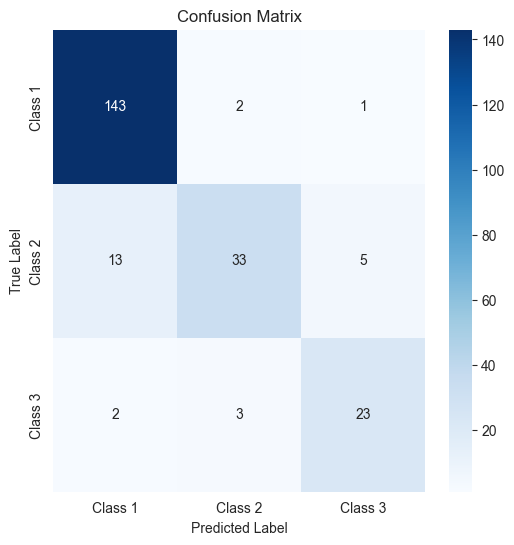

In [12]:
from data_preparation.utils import show_confusion_matrix

show_confusion_matrix(y_test, y_pred)

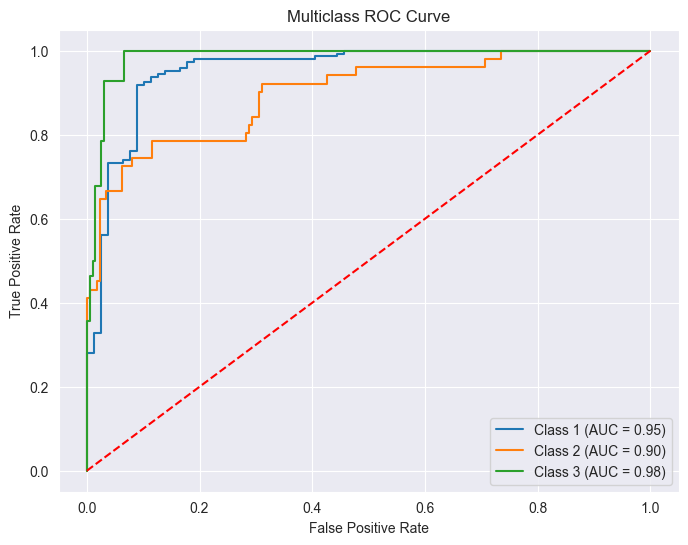

In [13]:
from data_preparation.utils import show_roc

show_roc(y_test, y_pred_proba)

### Interpretácia modelu

### Trieda 1
- Fajčenie (0 - nefajčiar, 1 - fajčiar):

Vidíme výrazný pokles predikcie pri fajčení (1.0). To znamená, že nefajčiari majú vyššiu pravdepodobnosť pre cieľovú triedu, zatiaľ čo fajčenie znižuje túto pravdepodobnosť.

- Alkohol (0 - nepije, 1 - pije) a vek

Pre Alkohol a vek sú krivky takmer rovné, čo naznačuje, že tieto atribúty nemajú veľký vplyv na predikciu triedy 1.

In [144]:
# from sklearn.inspection import PartialDependenceDisplay
# import matplotlib.pyplot as plt
#
# # Generate partial dependence plots for selected features
# PartialDependenceDisplay.from_estimator(
#     model,
#     X_test,
#     features=["Fajčenie", "Alkohol", "Vek"],
#     feature_names=X_test.columns,
#     target=2,
#     random_state=42,
# )
# plt.show()

In [145]:
# from sklearn.inspection import PartialDependenceDisplay
# import matplotlib.pyplot as plt
#
# # Generate partial dependence plots for selected features
# PartialDependenceDisplay.from_estimator(
#     model,
#     X_test,
#     features=["Fajčenie", "Alkohol", "Vek"],
#     feature_names=X_test.columns,
#     target=3,
#     random_state=42,
# )
# plt.show()

#### SHAP Hodnoty

In [12]:
# TODO

#### Cross-Validation

In [13]:
# from sklearn.model_selection import cross_val_score
#
# scores = cross_val_score(model, X, y, cv=10)
# print("Cross-validated F1 scores:", scores)

# XGBoost

In [14]:
from xgboost import XGBClassifier


X_train, X_test, y_train, y_test = train_test_split(
    X, y, test_size=0.2, random_state=42, stratify=y
)
y_test = y_test.astype(float) - 1
y_train = y_train.astype(float) - 1

xgb_model = XGBClassifier(
    objective="multi:softmax", num_class=3, enable_categorical=True, random_state=42
)
xgb_model.fit(X_train, y_train)

xgb_preds = xgb_model.predict(X_test)
xgb_probs = xgb_model.predict_proba(X_test)

NameError: name 'train_test_split' is not defined

In [199]:
from data_preparation.utils import show_metrics


show_metrics(y_test, xgb_preds, xgb_probs)

Výsledky modelu:
Accuracy: 0.8560
Precision: 0.8484
Recall: 0.8560
F1-score: 0.8415
AUC-ROC: 0.9183

Klasifikačná správa:
              precision    recall  f1-score   support

         0.0       0.88      0.98      0.92       182
         1.0       0.79      0.44      0.57        43
         2.0       0.74      0.68      0.71        25

    accuracy                           0.86       250
   macro avg       0.80      0.70      0.73       250
weighted avg       0.85      0.86      0.84       250



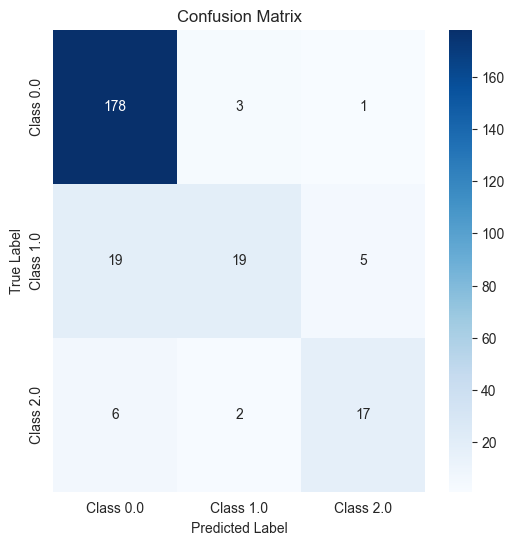

In [200]:
from data_preparation.utils import show_confusion_matrix

show_confusion_matrix(y_test, xgb_preds)

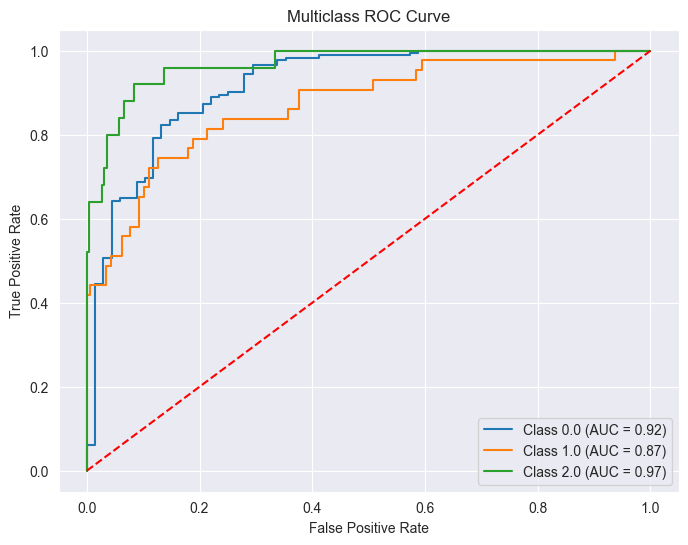

In [201]:
from data_preparation.utils import show_roc

show_roc(y_test, xgb_probs)

# LightGBM

In [15]:
from lightgbm import LGBMClassifier


X_train, X_test, y_train, y_test = train_test_split(
    X, y, test_size=0.2, random_state=42, stratify=y
)

X_train.columns = X_train.columns.str.replace(r"[^\w\s]", "", regex=True)
X_test.columns = X_test.columns.str.replace(r"[^\w\s]", "", regex=True)

lgbm_model = LGBMClassifier(objective="multiclass", num_class=3, random_state=42)
lgbm_model.fit(X_train, y_train)

lgbm_preds = lgbm_model.predict(X_test)
lgbm_probs = lgbm_model.predict_proba(X_test)

NameError: name 'train_test_split' is not defined

In [203]:
from data_preparation.utils import show_metrics


show_metrics(y_test, lgbm_preds, lgbm_probs)

Výsledky modelu:
Accuracy: 0.8680
Precision: 0.8647
Recall: 0.8680
F1-score: 0.8544
AUC-ROC: 0.9269

Klasifikačná správa:
              precision    recall  f1-score   support

         1.0       0.87      0.98      0.93       182
         2.0       0.83      0.47      0.60        43
         3.0       0.86      0.72      0.78        25

    accuracy                           0.87       250
   macro avg       0.85      0.72      0.77       250
weighted avg       0.86      0.87      0.85       250



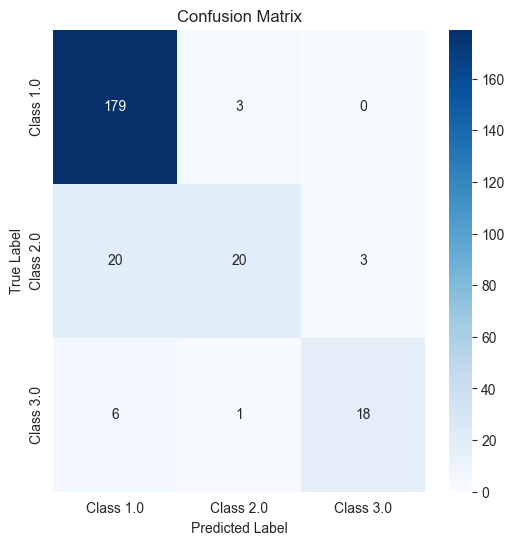

In [204]:
from data_preparation.utils import show_confusion_matrix

show_confusion_matrix(y_test, lgbm_preds)

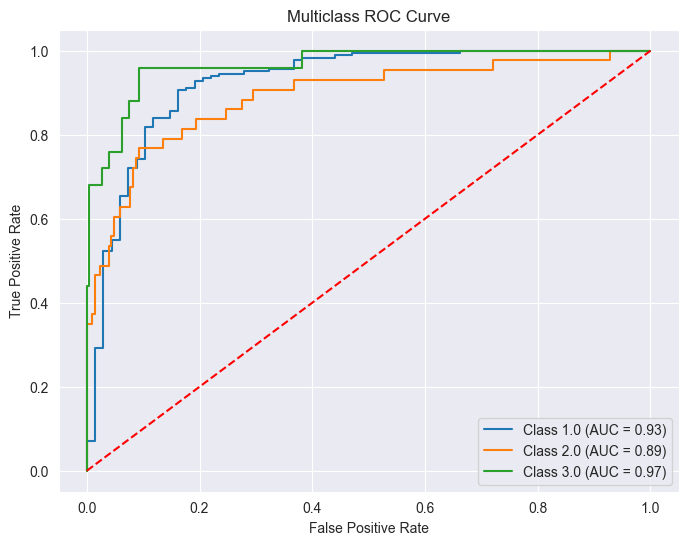

In [205]:
from data_preparation.utils import show_roc

show_roc(y_test, lgbm_probs)

# LightGBM (SMOTE)

In [206]:
from lightgbm import LGBMClassifier


X_train, X_test, y_train, y_test = train_test_split(
    X, y, test_size=0.2, random_state=42, stratify=y
)

X_train.columns = X_train.columns.str.replace(r"[^\w\s]", "", regex=True)
X_test.columns = X_test.columns.str.replace(r"[^\w\s]", "", regex=True)

# ✅ 2️⃣ One-hot encoding pre kategorizované atribúty
X_train = pd.get_dummies(X_train)
X_test = pd.get_dummies(X_test)

# ✅ 3️⃣ Zabezpečenie rovnakých stĺpcov v tréningovej aj testovacej množine
X_test = X_test.reindex(columns=X_train.columns, fill_value=0)

# ✅ 4️⃣ Detekcia boolean-like stĺpcov (0/1)
BOOLEAN_FEATURES = [
    col for col in X_train.columns if set(X_train[col].unique()) == {0, 1}
]

# ✅ 5️⃣ Konverzia boolean-like stĺpcov na `int`
X_train[BOOLEAN_FEATURES] = X_train[BOOLEAN_FEATURES].astype(int)
X_test[BOOLEAN_FEATURES] = X_test[BOOLEAN_FEATURES].astype(int)

# ✅ 6️⃣ Inicializácia KNN imputera a imputácia chýbajúcich hodnôt
imputer = KNNImputer(n_neighbors=5)
X_train = pd.DataFrame(
    imputer.fit_transform(X_train), columns=X_train.columns, index=X_train.index
)
X_test = pd.DataFrame(
    imputer.transform(X_test), columns=X_test.columns, index=X_test.index
)

# ✅ 8️⃣ Použitie SMOTE na vyváženie datasetu (iba na tréningové dáta!)
smote = SMOTE(random_state=42)
X_train_resampled, y_train_resampled = smote.fit_resample(X_train, y_train)

lgbm_model = LGBMClassifier(objective="multiclass", num_class=3, random_state=42)
lgbm_model.fit(X_train_resampled, y_train_resampled)

lgbm_preds = lgbm_model.predict(X_test)
lgbm_probs = lgbm_model.predict_proba(X_test)

[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.005323 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 56041
[LightGBM] [Info] Number of data points in the train set: 2175, number of used features: 246
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612


In [207]:
from data_preparation.utils import show_metrics


show_metrics(y_test, lgbm_preds, lgbm_probs)

Výsledky modelu:
Accuracy: 0.8520
Precision: 0.8428
Recall: 0.8520
F1-score: 0.8426
AUC-ROC: 0.9233

Klasifikačná správa:
              precision    recall  f1-score   support

         1.0       0.89      0.96      0.92       182
         2.0       0.72      0.49      0.58        43
         3.0       0.72      0.72      0.72        25

    accuracy                           0.85       250
   macro avg       0.78      0.72      0.74       250
weighted avg       0.84      0.85      0.84       250



# Logistic regression

In [208]:
from sklearn.preprocessing import StandardScaler
from sklearn.impute import KNNImputer
from interpret.glassbox import LogisticRegression
from sklearn.model_selection import train_test_split

# Rozdelenie dát
X_train, X_test, y_train, y_test = train_test_split(
    X, y, test_size=0.2, random_state=42, stratify=y
)

# 1️⃣ One-hot encoding pre kategorizované atribúty
X_train = pd.get_dummies(X_train)
X_test = pd.get_dummies(X_test)

# 2️⃣ Zabezpečenie rovnakých stĺpcov v tréningovej aj testovacej množine
X_test = X_test.reindex(columns=X_train.columns, fill_value=0)

# 3️⃣ Detekcia boolean-like stĺpcov (0/1)
BOOLEAN_FEATURES = [
    col for col in X_train.columns if set(X_train[col].unique()) == {0, 1}
]

# 4️⃣ Konverzia boolean-like stĺpcov na `int`
X_train[BOOLEAN_FEATURES] = X_train[BOOLEAN_FEATURES].astype(int)
X_test[BOOLEAN_FEATURES] = X_test[BOOLEAN_FEATURES].astype(int)

# 5️⃣ Inicializácia KNN imputera
imputer = KNNImputer(n_neighbors=5)

# 6️⃣ Imputujeme iba numerické atribúty
X_train = pd.DataFrame(
    imputer.fit_transform(X_train), columns=X_train.columns, index=X_train.index
)
X_test = pd.DataFrame(
    imputer.transform(X_test), columns=X_test.columns, index=X_test.index
)

# 7️⃣ Normalizácia dát pomocou StandardScaler
scaler = StandardScaler()
X_train = pd.DataFrame(
    scaler.fit_transform(X_train), columns=X_train.columns, index=X_train.index
)
X_test = pd.DataFrame(
    scaler.transform(X_test), columns=X_test.columns, index=X_test.index
)

# 8️⃣ Tréning modelu (bez `multi_class`)
logreg_model = LogisticRegression(solver="lbfgs", max_iter=1000, random_state=42)
logreg_model.fit(X_train, y_train)

# 9️⃣ Predikcie
logreg_preds = logreg_model.predict(X_test)
logreg_probs = logreg_model.predict_proba(X_test)

In [209]:
from data_preparation.utils import show_metrics


show_metrics(y_test, logreg_preds, logreg_probs)

Výsledky modelu:
Accuracy: 0.7960
Precision: 0.8071
Recall: 0.7960
F1-score: 0.7990
AUC-ROC: 0.8545

Klasifikačná správa:
              precision    recall  f1-score   support

         1.0       0.90      0.87      0.89       182
         2.0       0.56      0.51      0.54        43
         3.0       0.53      0.76      0.62        25

    accuracy                           0.80       250
   macro avg       0.66      0.71      0.68       250
weighted avg       0.81      0.80      0.80       250



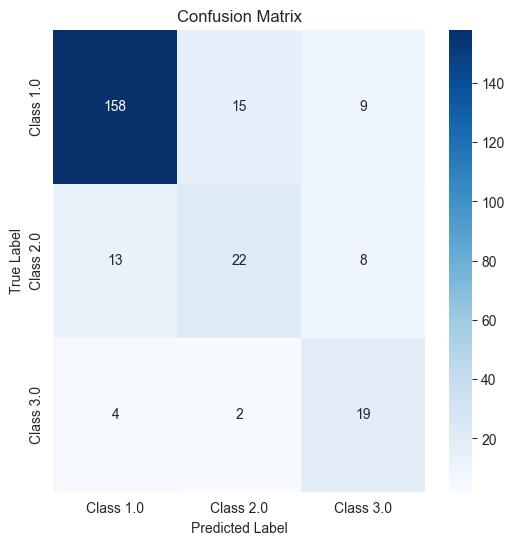

In [210]:
from data_preparation.utils import show_confusion_matrix

show_confusion_matrix(y_test, logreg_preds)

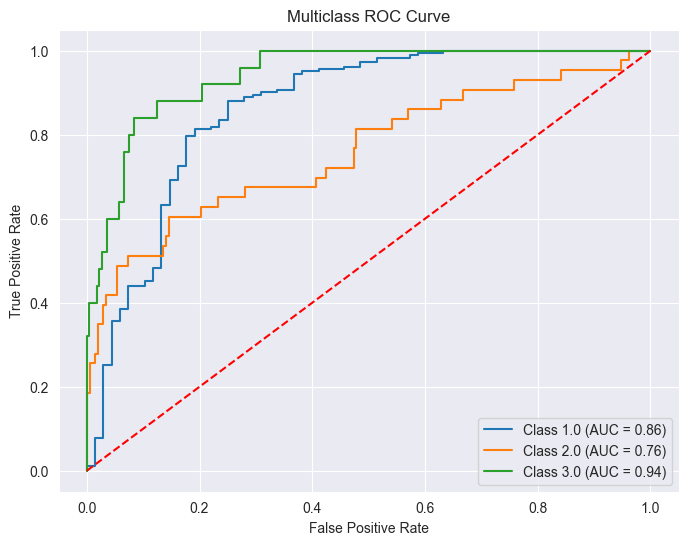

In [211]:
from data_preparation.utils import show_roc

show_roc(y_test, logreg_probs)

# Logistic Regressions (SMOTE)

In [212]:
import pandas as pd
from sklearn.impute import KNNImputer
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.linear_model import LogisticRegression
from imblearn.over_sampling import SMOTE

# ✅ 1️⃣ Rozdelenie datasetu
X_train, X_test, y_train, y_test = train_test_split(
    X, y, test_size=0.2, random_state=42, stratify=y
)

# ✅ 2️⃣ One-hot encoding pre kategorizované atribúty
X_train = pd.get_dummies(X_train)
X_test = pd.get_dummies(X_test)

# ✅ 3️⃣ Zabezpečenie rovnakých stĺpcov v tréningovej aj testovacej množine
X_test = X_test.reindex(columns=X_train.columns, fill_value=0)

# ✅ 4️⃣ Detekcia boolean-like stĺpcov (0/1)
BOOLEAN_FEATURES = [
    col for col in X_train.columns if set(X_train[col].unique()) == {0, 1}
]

# ✅ 5️⃣ Konverzia boolean-like stĺpcov na `int`
X_train[BOOLEAN_FEATURES] = X_train[BOOLEAN_FEATURES].astype(int)
X_test[BOOLEAN_FEATURES] = X_test[BOOLEAN_FEATURES].astype(int)

# ✅ 6️⃣ Inicializácia KNN imputera a imputácia chýbajúcich hodnôt
imputer = KNNImputer(n_neighbors=5)
X_train = pd.DataFrame(
    imputer.fit_transform(X_train), columns=X_train.columns, index=X_train.index
)
X_test = pd.DataFrame(
    imputer.transform(X_test), columns=X_test.columns, index=X_test.index
)

# ✅ 7️⃣ Normalizácia dát
scaler = StandardScaler()
X_train = pd.DataFrame(
    scaler.fit_transform(X_train), columns=X_train.columns, index=X_train.index
)
X_test = pd.DataFrame(
    scaler.transform(X_test), columns=X_test.columns, index=X_test.index
)

# ✅ 8️⃣ Použitie SMOTE na vyváženie datasetu (iba na tréningové dáta!)
smote = SMOTE(random_state=42)
X_train_resampled, y_train_resampled = smote.fit_resample(X_train, y_train)

# ✅ 9️⃣ Tréning modelu po aplikácii SMOTE
logreg_model = LogisticRegression(solver="lbfgs", max_iter=1000, random_state=42)
logreg_model.fit(X_train_resampled, y_train_resampled)

# ✅ 🔟 Predikcie a hodnotenie modelu
logreg_preds = logreg_model.predict(X_test)
logreg_probs = logreg_model.predict_proba(X_test)

In [213]:
from data_preparation.utils import show_metrics


show_metrics(y_test, logreg_preds, logreg_probs)

Výsledky modelu:
Accuracy: 0.7640
Precision: 0.7875
Recall: 0.7640
F1-score: 0.7721
AUC-ROC: 0.8397

Klasifikačná správa:
              precision    recall  f1-score   support

         1.0       0.90      0.82      0.86       182
         2.0       0.48      0.51      0.49        43
         3.0       0.51      0.76      0.61        25

    accuracy                           0.76       250
   macro avg       0.63      0.70      0.66       250
weighted avg       0.79      0.76      0.77       250



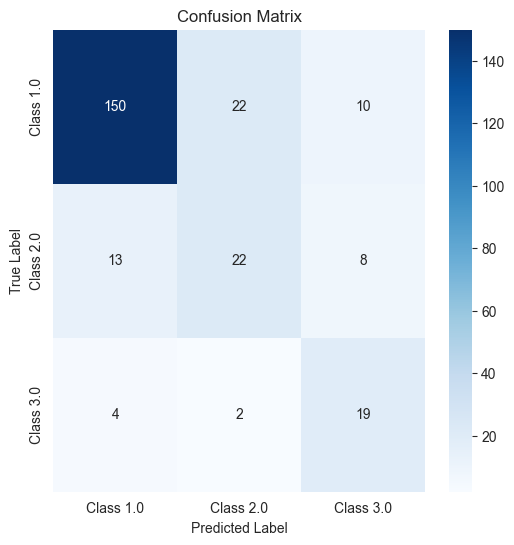

In [214]:
from data_preparation.utils import show_confusion_matrix

show_confusion_matrix(y_test, logreg_preds)

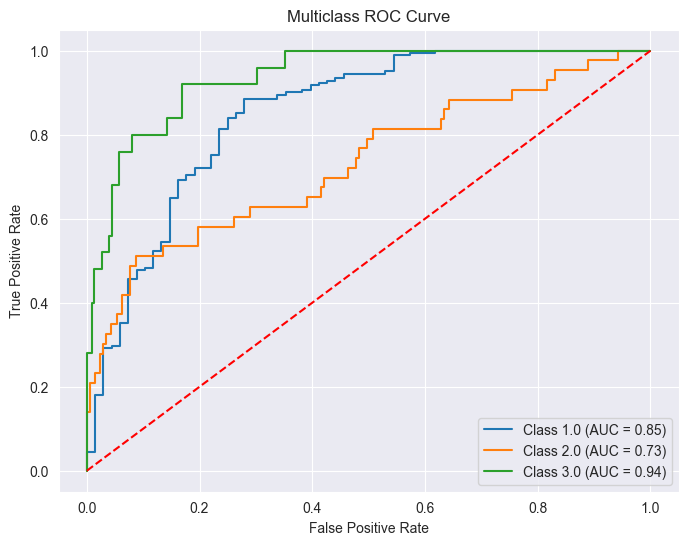

In [215]:
from data_preparation.utils import show_roc

show_roc(y_test, logreg_probs)

# Logistic regression (TOP 50 attributes)

In [216]:
import pandas as pd
from sklearn.impute import KNNImputer
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.linear_model import LogisticRegression
from sklearn.feature_selection import SelectKBest, f_classif
from imblearn.over_sampling import SMOTE

# ✅ 1️⃣ Rozdelenie datasetu
X_train, X_test, y_train, y_test = train_test_split(
    X, y, test_size=0.2, random_state=42, stratify=y
)

# ✅ 2️⃣ One-hot encoding pre kategorizované atribúty
X_train = pd.get_dummies(X_train)
X_test = pd.get_dummies(X_test)

# ✅ 3️⃣ Zabezpečenie rovnakých stĺpcov v tréningovej aj testovacej množine
X_test = X_test.reindex(columns=X_train.columns, fill_value=0)

# ✅ 4️⃣ Detekcia boolean-like stĺpcov (0/1)
BOOLEAN_FEATURES = [
    col for col in X_train.columns if set(X_train[col].unique()) == {0, 1}
]

# ✅ 5️⃣ Konverzia boolean-like stĺpcov na `int`
X_train[BOOLEAN_FEATURES] = X_train[BOOLEAN_FEATURES].astype(int)
X_test[BOOLEAN_FEATURES] = X_test[BOOLEAN_FEATURES].astype(int)

# ✅ 6️⃣ Inicializácia KNN imputera a imputácia chýbajúcich hodnôt
imputer = KNNImputer(n_neighbors=5)
X_train = pd.DataFrame(
    imputer.fit_transform(X_train), columns=X_train.columns, index=X_train.index
)
X_test = pd.DataFrame(
    imputer.transform(X_test), columns=X_test.columns, index=X_test.index
)

# ✅ 7️⃣ Normalizácia dát
scaler = StandardScaler()
X_train = pd.DataFrame(
    scaler.fit_transform(X_train), columns=X_train.columns, index=X_train.index
)
X_test = pd.DataFrame(
    scaler.transform(X_test), columns=X_test.columns, index=X_test.index
)

# ✅ 8️⃣ Feature Selection (výber top 15 atribútov)
k_best = SelectKBest(score_func=f_classif, k=50)
X_train_selected = k_best.fit_transform(X_train, y_train)
X_test_selected = k_best.transform(X_test)

# ✅ 9️⃣ Použitie SMOTE na vyváženie datasetu (iba na tréningové dáta!)
smote = SMOTE(random_state=42)
X_train_resampled, y_train_resampled = smote.fit_resample(X_train_selected, y_train)

# ✅ 🔟 Tréning modelu po Feature Selection
logreg_model = LogisticRegression(solver="lbfgs", max_iter=1000, random_state=42)
logreg_model.fit(X_train_resampled, y_train_resampled)

# ✅ 1️⃣1️⃣ Predikcie a hodnotenie modelu
logreg_preds = logreg_model.predict(X_test_selected)
logreg_probs = logreg_model.predict_proba(X_test_selected)

C:\Users\pavol\Downloads\nove_studium2\1_rocnik\letny\dp\dp\venv310\lib\site-packages\sklearn\feature_selection\_univariate_selection.py:111: UserWarning:

Features [207 210] are constant.

C:\Users\pavol\Downloads\nove_studium2\1_rocnik\letny\dp\dp\venv310\lib\site-packages\sklearn\feature_selection\_univariate_selection.py:112: RuntimeWarning:

invalid value encountered in divide



In [217]:
from data_preparation.utils import show_metrics


show_metrics(y_test, logreg_preds, logreg_probs)

Výsledky modelu:
Accuracy: 0.7200
Precision: 0.7776
Recall: 0.7200
F1-score: 0.7381
AUC-ROC: 0.8487

Klasifikačná správa:
              precision    recall  f1-score   support

         1.0       0.91      0.75      0.82       182
         2.0       0.39      0.53      0.45        43
         3.0       0.50      0.80      0.62        25

    accuracy                           0.72       250
   macro avg       0.60      0.70      0.63       250
weighted avg       0.78      0.72      0.74       250



# Logistic regression (RFECV)

In [218]:
import pandas as pd
from sklearn.impute import KNNImputer
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.linear_model import LogisticRegression
from sklearn.feature_selection import RFECV
from imblearn.over_sampling import SMOTE

# ✅ 1️⃣ Rozdelenie datasetu
X_train, X_test, y_train, y_test = train_test_split(
    X, y, test_size=0.2, random_state=42, stratify=y
)

# ✅ 2️⃣ One-hot encoding pre kategorizované atribúty
X_train = pd.get_dummies(X_train)
X_test = pd.get_dummies(X_test)

# ✅ 3️⃣ Zabezpečenie rovnakých stĺpcov v tréningovej aj testovacej sade
X_test = X_test.reindex(columns=X_train.columns, fill_value=0)

# ✅ 4️⃣ Detekcia boolean-like stĺpcov (0/1)
BOOLEAN_FEATURES = [
    col for col in X_train.columns if set(X_train[col].unique()) == {0, 1}
]

# ✅ 5️⃣ Konverzia boolean-like stĺpcov na `int`
X_train[BOOLEAN_FEATURES] = X_train[BOOLEAN_FEATURES].astype(int)
X_test[BOOLEAN_FEATURES] = X_test[BOOLEAN_FEATURES].astype(int)

# ✅ 6️⃣ Inicializácia KNN imputera a imputácia chýbajúcich hodnôt
imputer = KNNImputer(n_neighbors=5)
X_train = pd.DataFrame(
    imputer.fit_transform(X_train), columns=X_train.columns, index=X_train.index
)
X_test = pd.DataFrame(
    imputer.transform(X_test), columns=X_test.columns, index=X_test.index
)

# ✅ 7️⃣ Normalizácia dát
scaler = StandardScaler()
X_train = pd.DataFrame(
    scaler.fit_transform(X_train), columns=X_train.columns, index=X_train.index
)
X_test = pd.DataFrame(
    scaler.transform(X_test), columns=X_test.columns, index=X_test.index
)

# ✅ 8️⃣ Použitie RFECV na výber optimálnych atribútov
logreg = LogisticRegression(solver="lbfgs", max_iter=1000, random_state=42)

rfecv = RFECV(
    estimator=logreg, step=1, cv=5, scoring="accuracy"
)  # 5-fold cross-validation
X_train_selected = rfecv.fit_transform(X_train, y_train)
X_test_selected = rfecv.transform(X_test)

# ✅ 9️⃣ Použitie SMOTE na vyváženie datasetu (iba na tréningové dáta!)
smote = SMOTE(random_state=42)
X_train_resampled, y_train_resampled = smote.fit_resample(X_train_selected, y_train)

# ✅ 🔟 Tréning modelu po RFECV
logreg_model = LogisticRegression(solver="lbfgs", max_iter=1000, random_state=42)
logreg_model.fit(X_train_resampled, y_train_resampled)

# ✅ 1️⃣1️⃣ Predikcie a hodnotenie modelu
logreg_preds = logreg_model.predict(X_test_selected)
logreg_probs = logreg_model.predict_proba(X_test_selected)


# ✅ 1️⃣2️⃣ Zobrazenie dôležitosti atribútov
selected_features = X_train.columns[rfecv.support_]
print(f"Vybrané atribúty: {list(selected_features)}")
print(f"Počet vybraných atribútov: {len(selected_features)}")

Vybrané atribúty: ['S-Bil-T last', 'S-ALT min', 'S-ALP first', 'S-ALP min', 'S-ALP max', 'S-CB last', 'S-CB min', 'S-Na first', 'S-Na last', 'S-Na max', 'S-CL last', 'S-CL max', 'S-IgG min', 'S-CRP last', 'S-Alb last', 'S-Gluk last', 'S-Urea first', 'S-Urea last', 'S-Urea min', 'S-Urea max', 'S-Kreat first', 'S-Kreat last', 'S-KM first', 'S-KM last', 'S-KM min', 'S-CK max', 'S-CK-MB first', 'S-CK-MB last', 'S-CK-MB min', 'S-CK-MB max', 'S-LD min', 'S-IL6 first', 'S-IL6 min', 'S-IL6 max', 'HGB min', 'HGB max', 'WBC first', 'Neu abs first', 'Neu abs max', 'PT (INR) last', 'PT (INR) min', 'Fib first', 'Fib last', 'Fib min', 'Fib max', 'CD3+ last', 'CD4+ first', 'PDW last', 'PDW max', 'NE/LY(NLR) first', 'NE/LY(NLR) min', 'NE/LY(NLR) max', 'D-dimér HS min', 'Diabetes mellitus', 'Kardiovaskulárne ochorenia', 'Renálne ochorenia', '24836 | ACIDUM ASCORBICUM BBP', '24814 | CALCIFEROL BBP 7,5 MG/ML', '89145 | VITAMIN C-INJEKTOPAS', '84090 | DEXAMED 6', '87299 | IMUNOR', '0471B MOLOXIN', 'S-PBNP

In [219]:
from data_preparation.utils import show_metrics


show_metrics(y_test, logreg_preds, logreg_probs)

Výsledky modelu:
Accuracy: 0.7520
Precision: 0.7890
Recall: 0.7520
F1-score: 0.7643
AUC-ROC: 0.8467

Klasifikačná správa:
              precision    recall  f1-score   support

         1.0       0.91      0.80      0.85       182
         2.0       0.40      0.49      0.44        43
         3.0       0.55      0.84      0.67        25

    accuracy                           0.75       250
   macro avg       0.62      0.71      0.65       250
weighted avg       0.79      0.75      0.76       250



# Balanced Random Forest

In [220]:
import pandas as pd
from sklearn.model_selection import train_test_split
from imblearn.ensemble import BalancedRandomForestClassifier

# ✅ 1️⃣ Rozdelenie datasetu
X_train, X_test, y_train, y_test = train_test_split(
    X, y, test_size=0.2, random_state=42, stratify=y
)

# ✅ 2️⃣ One-hot encoding pre kategorizované atribúty
X_train = pd.get_dummies(X_train)
X_test = pd.get_dummies(X_test)

# ✅ 3️⃣ Zabezpečenie rovnakých stĺpcov v tréningovej aj testovacej sade
X_test = X_test.reindex(columns=X_train.columns, fill_value=0)

# ✅ 4️⃣ Detekcia boolean-like stĺpcov (0/1)
BOOLEAN_FEATURES = [
    col for col in X_train.columns if set(X_train[col].unique()) == {0, 1}
]

# ✅ 5️⃣ Konverzia boolean-like stĺpcov na `int`
X_train[BOOLEAN_FEATURES] = X_train[BOOLEAN_FEATURES].astype(int)
X_test[BOOLEAN_FEATURES] = X_test[BOOLEAN_FEATURES].astype(int)

# ✅ 8️⃣ Tréning Balanced Random Forest
brf_model = BalancedRandomForestClassifier(n_estimators=100, random_state=42, n_jobs=-1)
brf_model.fit(X_train, y_train)

# ✅ 9️⃣ Predikcie a hodnotenie modelu
brf_preds = brf_model.predict(X_test)
brf_probs = brf_model.predict_proba(X_test)

# ✅ 🔟 Dôležitosť atribútov
feature_importances = pd.Series(
    brf_model.feature_importances_, index=X_train.columns
).sort_values(ascending=False)
print("\nTop 10 najdôležitejších atribútov:")
print(feature_importances.head(10))


Top 10 najdôležitejších atribútov:
S-IL6 last        0.031273
S-Urea last       0.027085
S-CRP last        0.026004
S-Na last         0.019369
S-Alb min         0.018745
S-CRP min         0.017030
S-Alb last        0.015295
D-dimér HS max    0.014939
NE/LY(NLR) min    0.014749
S-Urea max        0.014708
dtype: float64


In [221]:
from data_preparation.utils import show_metrics


show_metrics(y_test, brf_preds, brf_probs)

Výsledky modelu:
Accuracy: 0.7440
Precision: 0.7691
Recall: 0.7440
F1-score: 0.7533
AUC-ROC: 0.8767

Klasifikačná správa:
              precision    recall  f1-score   support

         1.0       0.89      0.82      0.85       182
         2.0       0.40      0.44      0.42        43
         3.0       0.50      0.72      0.59        25

    accuracy                           0.74       250
   macro avg       0.60      0.66      0.62       250
weighted avg       0.77      0.74      0.75       250



# Balanced Random Forest (normalized data)

In [222]:
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from imblearn.ensemble import BalancedRandomForestClassifier

# ✅ 1️⃣ Rozdelenie datasetu
X_train, X_test, y_train, y_test = train_test_split(
    X, y, test_size=0.2, random_state=42, stratify=y
)

# ✅ 2️⃣ One-hot encoding pre kategorizované atribúty
X_train = pd.get_dummies(X_train)
X_test = pd.get_dummies(X_test)

# ✅ 3️⃣ Zabezpečenie rovnakých stĺpcov v tréningovej aj testovacej sade
X_test = X_test.reindex(columns=X_train.columns, fill_value=0)

# ✅ 4️⃣ Detekcia boolean-like stĺpcov (0/1)
BOOLEAN_FEATURES = [
    col for col in X_train.columns if set(X_train[col].unique()) == {0, 1}
]

# ✅ 5️⃣ Konverzia boolean-like stĺpcov na `int`
X_train[BOOLEAN_FEATURES] = X_train[BOOLEAN_FEATURES].astype(int)
X_test[BOOLEAN_FEATURES] = X_test[BOOLEAN_FEATURES].astype(int)

scaler = StandardScaler()
X_train = pd.DataFrame(
    scaler.fit_transform(X_train), columns=X_train.columns, index=X_train.index
)
X_test = pd.DataFrame(
    scaler.transform(X_test), columns=X_test.columns, index=X_test.index
)

# ✅ 8️⃣ Tréning Balanced Random Forest
brf_model = BalancedRandomForestClassifier(n_estimators=100, random_state=42, n_jobs=-1)
brf_model.fit(X_train, y_train)

# ✅ 9️⃣ Predikcie a hodnotenie modelu
brf_preds = brf_model.predict(X_test)
brf_probs = brf_model.predict_proba(X_test)
#
# ✅ 🔟 Dôležitosť atribútov
feature_importances = pd.Series(
    brf_model.feature_importances_, index=X_train.columns
).sort_values(ascending=False)
print("\nTop 10 najdôležitejších atribútov:")
print(feature_importances.head(10))


Top 10 najdôležitejších atribútov:
S-IL6 last        0.031273
S-Urea last       0.027085
S-CRP last        0.026004
S-Na last         0.019369
S-Alb min         0.018745
S-CRP min         0.017030
S-Alb last        0.015295
D-dimér HS max    0.014939
NE/LY(NLR) min    0.014749
S-Urea max        0.014708
dtype: float64


In [223]:
from data_preparation.utils import show_metrics


show_metrics(y_test, brf_preds, brf_probs)

Výsledky modelu:
Accuracy: 0.7440
Precision: 0.7691
Recall: 0.7440
F1-score: 0.7533
AUC-ROC: 0.8776

Klasifikačná správa:
              precision    recall  f1-score   support

         1.0       0.89      0.82      0.85       182
         2.0       0.40      0.44      0.42        43
         3.0       0.50      0.72      0.59        25

    accuracy                           0.74       250
   macro avg       0.60      0.66      0.62       250
weighted avg       0.77      0.74      0.75       250



# Balanced Random Forest (KNN imputer)

In [224]:
import pandas as pd
from sklearn.impute import KNNImputer
from sklearn.model_selection import train_test_split
from imblearn.ensemble import BalancedRandomForestClassifier

# ✅ 1️⃣ Rozdelenie datasetu
X_train, X_test, y_train, y_test = train_test_split(
    X, y, test_size=0.2, random_state=42, stratify=y
)

# ✅ 2️⃣ One-hot encoding pre kategorizované atribúty
X_train = pd.get_dummies(X_train)
X_test = pd.get_dummies(X_test)

# ✅ 3️⃣ Zabezpečenie rovnakých stĺpcov v tréningovej aj testovacej sade
X_test = X_test.reindex(columns=X_train.columns, fill_value=0)

# ✅ 4️⃣ Detekcia boolean-like stĺpcov (0/1)
BOOLEAN_FEATURES = [
    col for col in X_train.columns if set(X_train[col].unique()) == {0, 1}
]

# ✅ 5️⃣ Konverzia boolean-like stĺpcov na `int`
X_train[BOOLEAN_FEATURES] = X_train[BOOLEAN_FEATURES].astype(int)
X_test[BOOLEAN_FEATURES] = X_test[BOOLEAN_FEATURES].astype(int)

# ✅ 6️⃣ Inicializácia KNN imputera a imputácia chýbajúcich hodnôt
imputer = KNNImputer(n_neighbors=5)
X_train = pd.DataFrame(
    imputer.fit_transform(X_train), columns=X_train.columns, index=X_train.index
)
X_test = pd.DataFrame(
    imputer.transform(X_test), columns=X_test.columns, index=X_test.index
)
#
# # ✅ 7️⃣ Normalizácia dát (voliteľné pre Random Forest, ale môže pomôcť)
# scaler = StandardScaler()
# X_train = pd.DataFrame(scaler.fit_transform(X_train), columns=X_train.columns, index=X_train.index)
# X_test = pd.DataFrame(scaler.transform(X_test), columns=X_test.columns, index=X_test.index)

# ✅ 8️⃣ Tréning Balanced Random Forest
brf_model = BalancedRandomForestClassifier(n_estimators=100, random_state=42, n_jobs=-1)
brf_model.fit(X_train, y_train)

# ✅ 9️⃣ Predikcie a hodnotenie modelu
brf_preds = brf_model.predict(X_test)
brf_probs = brf_model.predict_proba(X_test)
#
# ✅ 🔟 Dôležitosť atribútov
feature_importances = pd.Series(
    brf_model.feature_importances_, index=X_train.columns
).sort_values(ascending=False)
print("\nTop 10 najdôležitejších atribútov:")
print(feature_importances.head(10))


Top 10 najdôležitejších atribútov:
S-IL6 last         0.033911
S-CRP last         0.028683
S-Urea last        0.022898
S-Alb last         0.019952
S-CRP min          0.018319
S-Gluk last        0.016977
S-Alb min          0.015156
NE/LY(NLR) last    0.014779
NE/LY(NLR) min     0.013752
S-Na last          0.012806
dtype: float64


In [225]:
from data_preparation.utils import show_metrics


show_metrics(y_test, brf_preds, brf_probs)

Výsledky modelu:
Accuracy: 0.7360
Precision: 0.7706
Recall: 0.7360
F1-score: 0.7486
AUC-ROC: 0.8796

Klasifikačná správa:
              precision    recall  f1-score   support

         1.0       0.90      0.81      0.85       182
         2.0       0.39      0.44      0.41        43
         3.0       0.47      0.72      0.57        25

    accuracy                           0.74       250
   macro avg       0.59      0.66      0.61       250
weighted avg       0.77      0.74      0.75       250



# Explainable Boosting Machine

In [29]:
from interpret.glassbox import ExplainableBoostingClassifier
from sklearn.model_selection import train_test_split

X_train, X_test, y_train, y_test = train_test_split(
    X, y, test_size=0.2, random_state=42, stratify=y
)

ebm_model = ExplainableBoostingClassifier(random_state=42)
ebm_model.fit(X_train, y_train)

ebm_preds = ebm_model.predict(X_test)
ebm_probs = ebm_model.predict_proba(X_test)

C:\Users\pavol\Downloads\nove_studium2\1_rocnik\letny\dp\dp\venv310\lib\site-packages\interpret\glassbox\_ebm\_ebm.py:813: UserWarning: Missing values detected. Our visualizations do not currently display missing values. To retain the glassbox nature of the model you need to either set the missing values to an extreme value like -1000 that will be visible on the graphs, or manually examine the missing value score in ebm.term_scores_[term_index][0]
  warn(
C:\Users\pavol\Downloads\nove_studium2\1_rocnik\letny\dp\dp\venv310\lib\site-packages\interpret\glassbox\_ebm\_ebm.py:1165: UserWarning: Detected multiclass problem. Forcing interactions to 0. Multiclass interactions only have local explanations. They are not currently displayed in the global explanation visualizations. Set interactions=0 to disable this warning. If you still want multiclass interactions, this API accepts a list, and the measure_interactions function can be used to detect them.
  warn(


In [30]:
from data_preparation.utils import show_metrics


show_metrics(y_test, ebm_preds, ebm_probs)

Výsledky modelu:
Accuracy: 0.8720
Precision: 0.8636
Recall: 0.8720
F1-score: 0.8627
AUC-ROC: 0.9199

Klasifikačná správa:
              precision    recall  f1-score   support

         1.0       0.90      0.98      0.94       182
         2.0       0.77      0.53      0.63        43
         3.0       0.77      0.68      0.72        25

    accuracy                           0.87       250
   macro avg       0.81      0.73      0.76       250
weighted avg       0.86      0.87      0.86       250



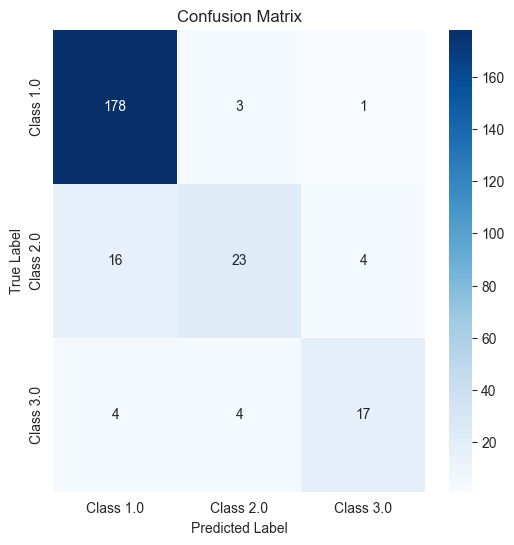

In [31]:
from data_preparation.utils import show_confusion_matrix

show_confusion_matrix(y_test, ebm_preds)

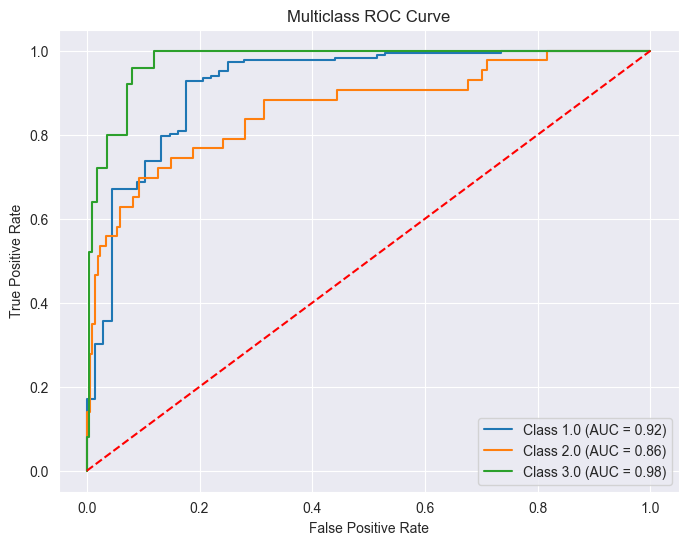

In [32]:
from data_preparation.utils import show_roc

show_roc(y_test, ebm_probs)

In [22]:
from interpret import set_visualize_provider, show
from interpret.provider import InlineProvider

set_visualize_provider(InlineProvider())
show(ebm_model.explain_global())

In [23]:
X_test[:5], y_test[:5]

(     Pohlavie  Vek  A04.7  Fajčenie  Alkohol  S-Bil-T first  S-Bil-T last  \
 907       Muž   81  False     False    False           15.0          15.0   
 1057     Žena   80  False     False    False           13.1          13.1   
 516      Žena   89  False     False    False           16.4          16.4   
 555       Muž   56  False     False    False           22.3          10.9   
 299      Žena   96  False     False    False           13.0          10.7   
 
       S-Bil-T min  S-Bil-T max  S-AST first  ...  ANOPYRIN  Prekonal COVID-19  \
 907          15.0         15.0         0.43  ...      True              False   
 1057         13.1         13.1         0.53  ...     False               True   
 516          16.4         16.4         0.49  ...     False              False   
 555          10.9         22.3         0.40  ...     False              False   
 299           7.6         13.0         0.40  ...     False              False   
 
       S-PBNP first  S-PBNP last  S-

In [24]:
show(ebm_model.explain_local(X_test[:5], y_test[:5]), 0)

# Explainable Boosting Machine (TOP N)

In [25]:
# TESTING
from interpret.glassbox import ExplainableBoostingClassifier

TOP_N_ATTRS = [
    "Pohlavie",
    "Vek",
    "S-IL6 last",
    "S-IL6 min",
    "S-IL6 max",
    "SatO2 %",
    "Renálne ochorenia",
    "S-CRP last",
    "S-CRP min",
    "D-dimér HS max",
    "S-Urea last",
    "S-Na max",
    "NE/LY(NLR) last",
]

X_train, X_test, y_train, y_test = train_test_split(
    X[TOP_N_ATTRS], y, test_size=0.2, random_state=42, stratify=y
)

ebm_model = ExplainableBoostingClassifier(random_state=42)
ebm_model.fit(X_train, y_train)

ebm_preds = ebm_model.predict(X_test)
ebm_probs = ebm_model.predict_proba(X_test)

C:\Users\pavol\Downloads\nove_studium2\1_rocnik\letny\dp\dp\venv310\lib\site-packages\interpret\glassbox\_ebm\_ebm.py:813: UserWarning:

Missing values detected. Our visualizations do not currently display missing values. To retain the glassbox nature of the model you need to either set the missing values to an extreme value like -1000 that will be visible on the graphs, or manually examine the missing value score in ebm.term_scores_[term_index][0]

C:\Users\pavol\Downloads\nove_studium2\1_rocnik\letny\dp\dp\venv310\lib\site-packages\interpret\glassbox\_ebm\_ebm.py:1165: UserWarning:

Detected multiclass problem. Forcing interactions to 0. Multiclass interactions only have local explanations. They are not currently displayed in the global explanation visualizations. Set interactions=0 to disable this warning. If you still want multiclass interactions, this API accepts a list, and the measure_interactions function can be used to detect them.



In [29]:
# DUMP
import joblib

joblib.dump(ebm_model, r"./model_dump/ebm_4_078.joblib")

['./model_dump/ebm_4_078.joblib']

In [26]:
from data_preparation.utils import show_metrics


show_metrics(y_test, ebm_preds, ebm_probs)

Výsledky modelu:
Accuracy: 0.8080
Precision: 0.7791
Recall: 0.8080
F1-score: 0.7817
AUC-ROC: 0.8993

Klasifikačná správa:
              precision    recall  f1-score   support

         1.0       0.85      0.97      0.91       182
         2.0       0.55      0.26      0.35        43
         3.0       0.62      0.60      0.61        25

    accuracy                           0.81       250
   macro avg       0.68      0.61      0.62       250
weighted avg       0.78      0.81      0.78       250



In [27]:
from interpret import set_visualize_provider, show
from interpret.provider import InlineProvider

set_visualize_provider(InlineProvider())
show(ebm_model.explain_global())

# Model dump

In [29]:
import joblib
from sklearn.model_selection import train_test_split


def train_and_dump(model, X, y, attributes, **model_kwargs):
    X_train, X_test, y_train, y_test = train_test_split(
        X[attributes], y, test_size=0.2, random_state=42, stratify=y
    )

    model.fit(X_train, y_train, **model_kwargs)
    joblib.dump(
        model, rf"./model_dump/{model.__class__.__name__}_{len(attributes)}.joblib"
    )

    return model

In [22]:
# TESTING
from interpret.glassbox import ExplainableBoostingClassifier


model = train_and_dump(
    model=ExplainableBoostingClassifier(random_state=42),
    X=X,
    y=y,
    attributes=["Pohlavie", "Vek", "Fajčenie", "Alkohol", "SatO2 %"],
)

C:\Users\pavol\Downloads\nove_studium2\1_rocnik\letny\dp\dp\venv310\lib\site-packages\interpret\glassbox\_ebm\_ebm.py:813: UserWarning: Missing values detected. Our visualizations do not currently display missing values. To retain the glassbox nature of the model you need to either set the missing values to an extreme value like -1000 that will be visible on the graphs, or manually examine the missing value score in ebm.term_scores_[term_index][0]
  warn(
C:\Users\pavol\Downloads\nove_studium2\1_rocnik\letny\dp\dp\venv310\lib\site-packages\interpret\glassbox\_ebm\_ebm.py:1165: UserWarning: Detected multiclass problem. Forcing interactions to 0. Multiclass interactions only have local explanations. They are not currently displayed in the global explanation visualizations. Set interactions=0 to disable this warning. If you still want multiclass interactions, this API accepts a list, and the measure_interactions function can be used to detect them.
  warn(


In [31]:
from catboost import CatBoostClassifier

model = train_and_dump(
    CatBoostClassifier(
        iterations=500,  # Number of boosting iterations
        learning_rate=0.2,  # Learning rate
        depth=6,  # Depth of the trees
        loss_function="MultiClass",  # Multi-class classification loss function
        verbose=100,  # Display progress every 100 iterations
        random_seed=42,  # Seed for reproducibility
    ),
    X,
    y,
    ["Pohlavie", "Vek", "Fajčenie", "Alkohol", "SatO2 %"],
    cat_features=["Pohlavie", "Vek", "Fajčenie", "Alkohol"],
)

0:	learn: 0.9515499	total: 2.5s	remaining: 20m 50s
100:	learn: 0.4411725	total: 19.6s	remaining: 1m 17s
200:	learn: 0.3167249	total: 24.8s	remaining: 36.9s
300:	learn: 0.2382988	total: 30.4s	remaining: 20.1s
400:	learn: 0.1856791	total: 35.6s	remaining: 8.79s
499:	learn: 0.1511335	total: 40.9s	remaining: 0us


In [36]:
from data_preparation.utils import show_metrics


show_metrics(y_test, ebm_preds, ebm_probs)

Výsledky modelu:
Accuracy: 0.7640
Precision: 0.7509
Recall: 0.7640
F1-score: 0.7013
AUC-ROC: 0.7448

Klasifikačná správa:
              precision    recall  f1-score   support

         1.0       0.77      0.99      0.87       182
         2.0       0.78      0.16      0.27        43
         3.0       0.57      0.16      0.25        25

    accuracy                           0.76       250
   macro avg       0.71      0.44      0.46       250
weighted avg       0.75      0.76      0.70       250



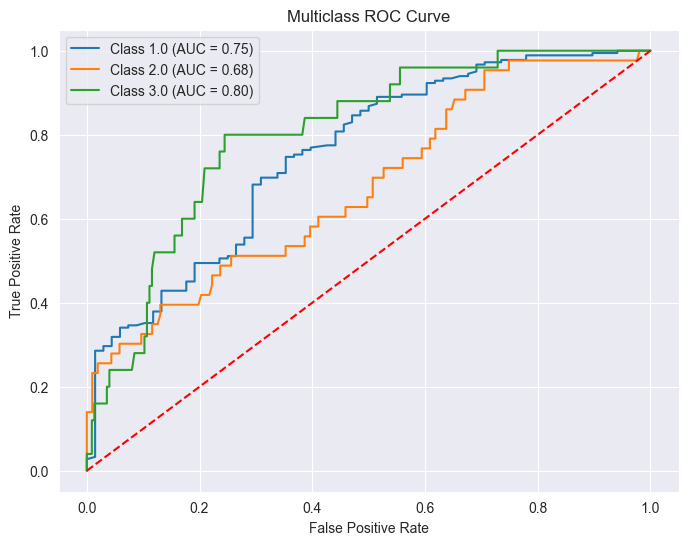

In [37]:
from data_preparation.utils import show_roc

show_roc(y_test, ebm_probs)